### Event Distribution of Mice with Time

In [28]:
import sys
sys.path.insert(0, '../scripts')

import numpy as np
import direction_transition as dit
import paths
from meals import find_meals, graph_group_stats
from preprocessing import read_csv_clean
import intervals as invs

pellet_count_threshold = 5
collect_quantile = 0.7
pellet_quantile = 0.7

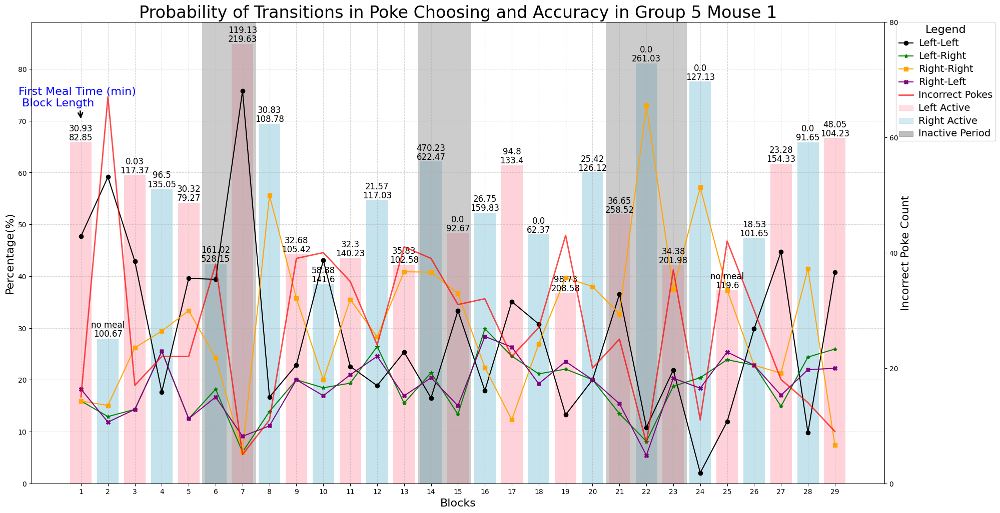

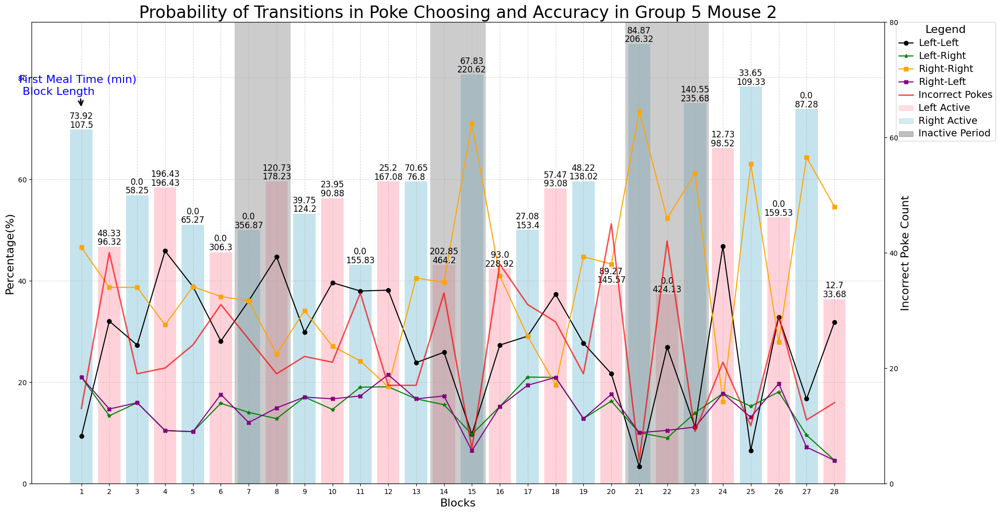

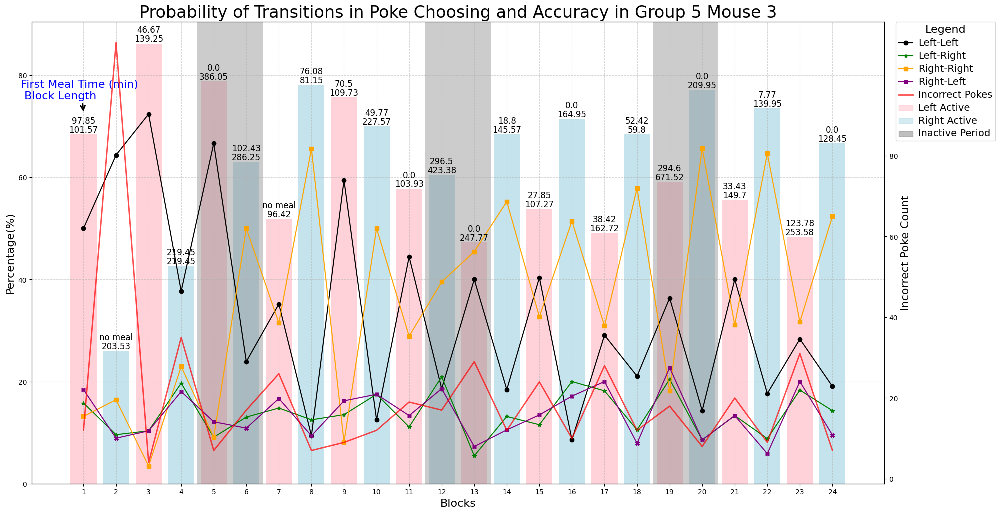

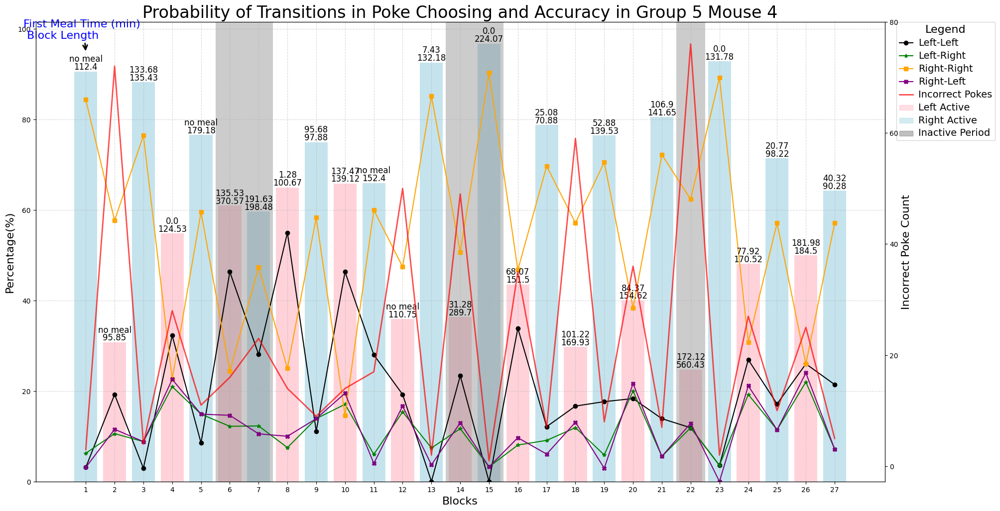

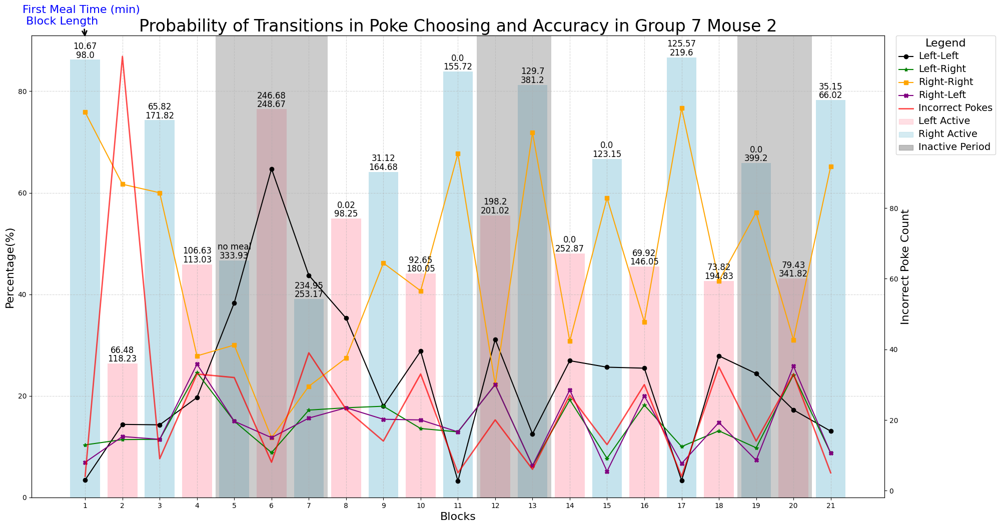

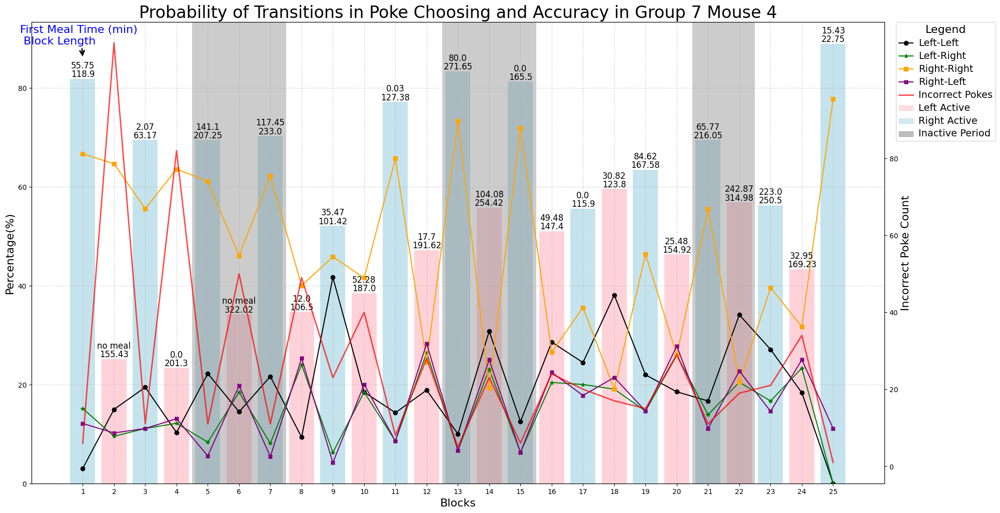

In [29]:
ctrl_block_fir_meal = []
ctrl_block_fir_meal_prop = []
for path in paths.contigency_flip_ctrl:
        data_dropped = read_csv_clean(path, remove_trivial=False, collect_time=True)
        blocks = dit.split_data_to_blocks(data_dropped)
        meal = find_meals(data_dropped, pellet_count_threshold=pellet_count_threshold, 
                             collect_quantile=collect_quantile, pellet_quantile=pellet_quantile)
        data_stats = dit.get_transition_info(blocks, meal, reverse=False)
        
        avg_ratio, avg_time = dit.first_meal_stats(data_stats, ignore_inactive=True)
        ctrl_block_fir_meal.append(avg_time)
        ctrl_block_fir_meal_prop.append(avg_ratio)
        dit.graph_tranition_stats(data_stats, blocks, path)

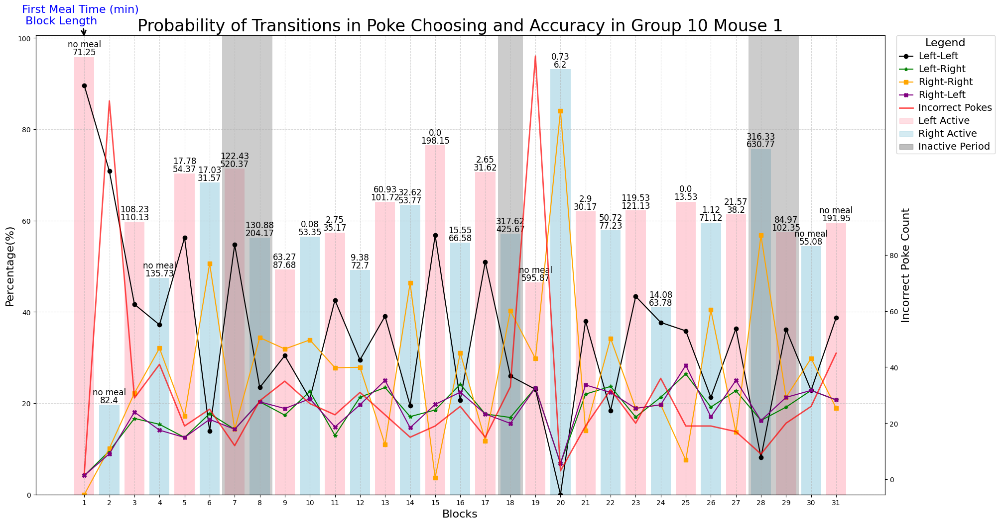

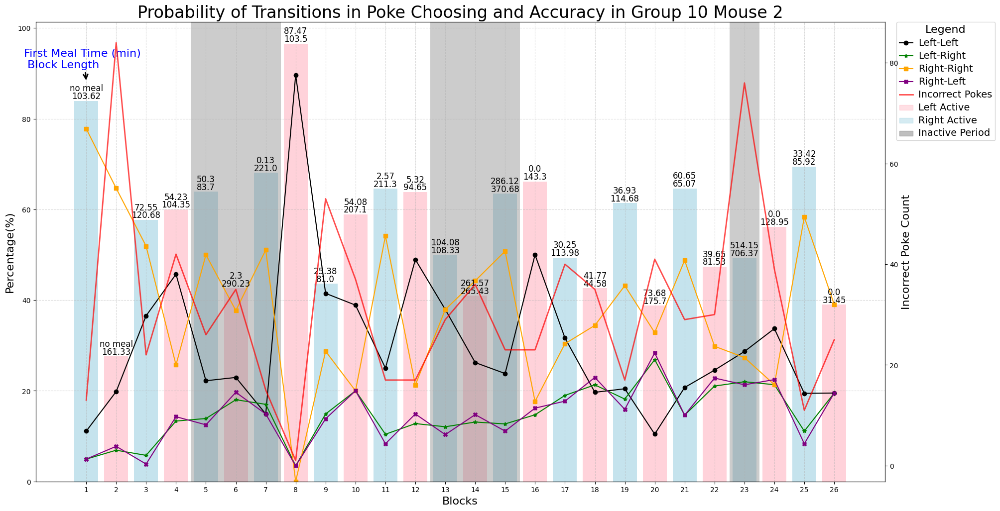

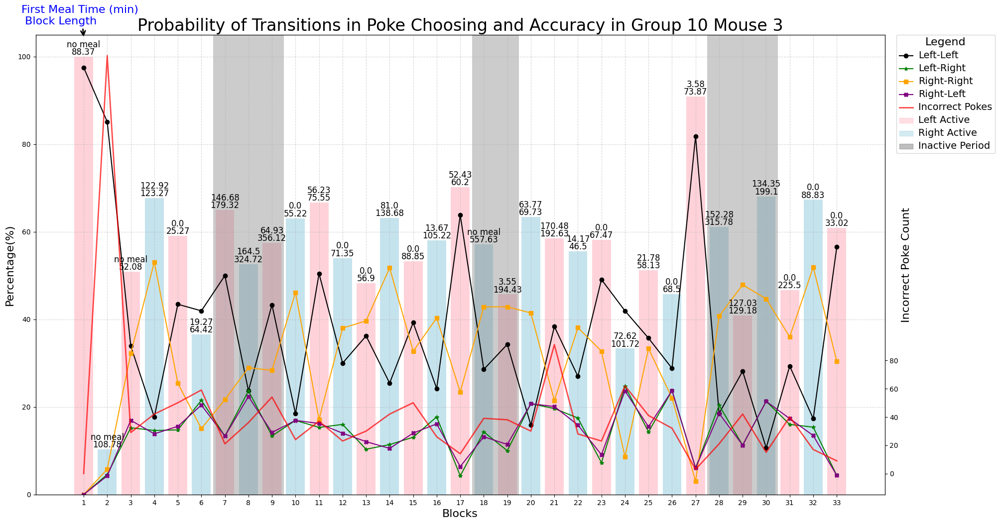

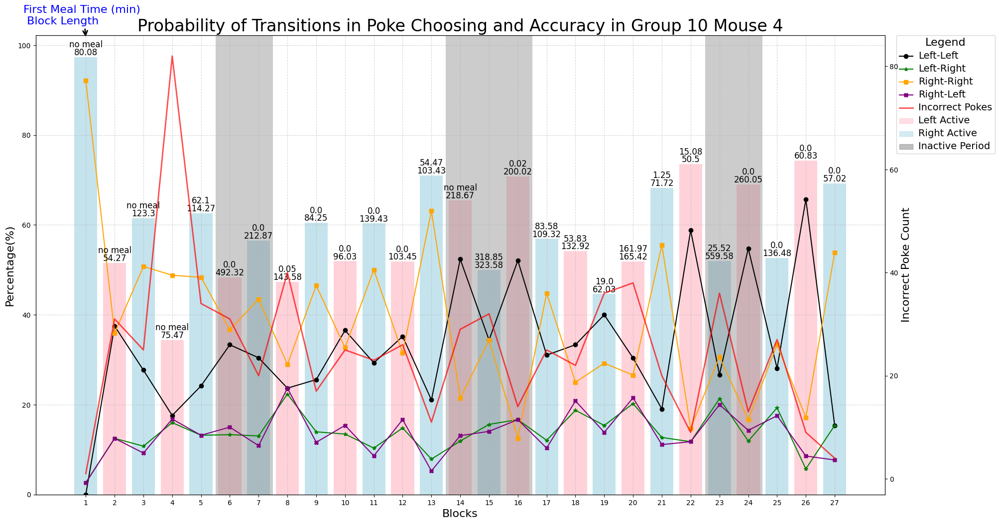

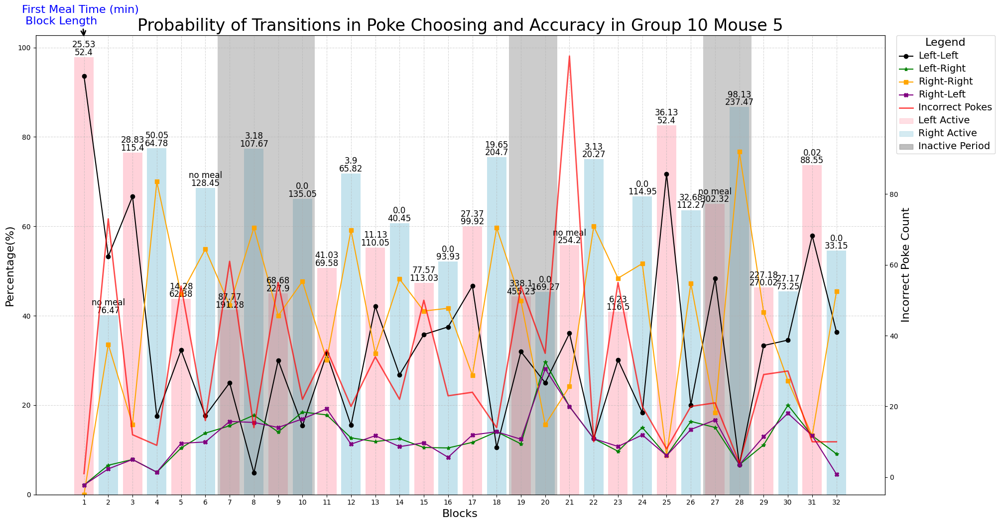

...

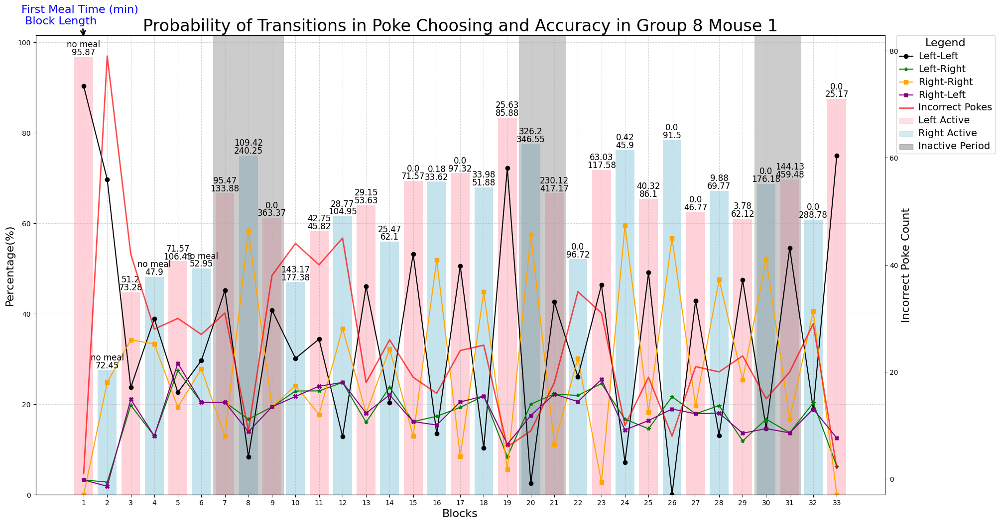

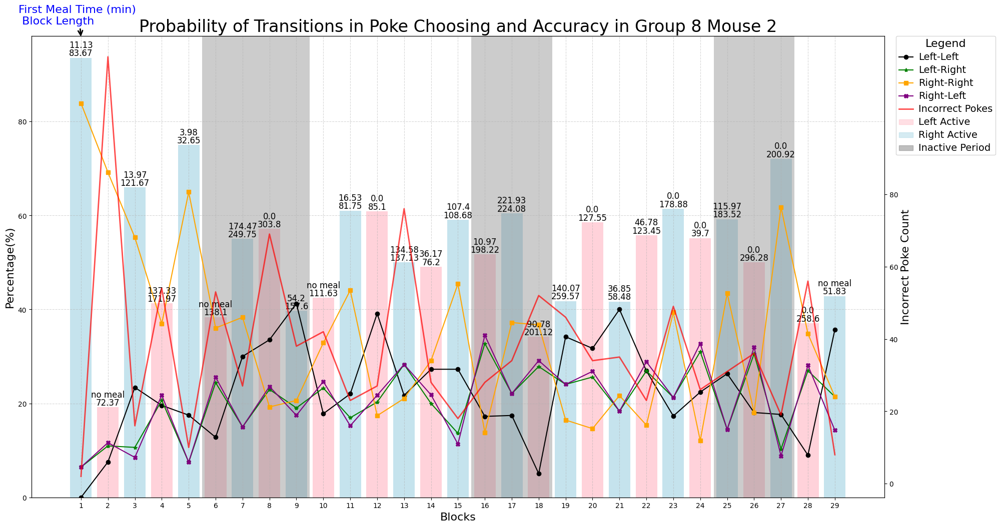

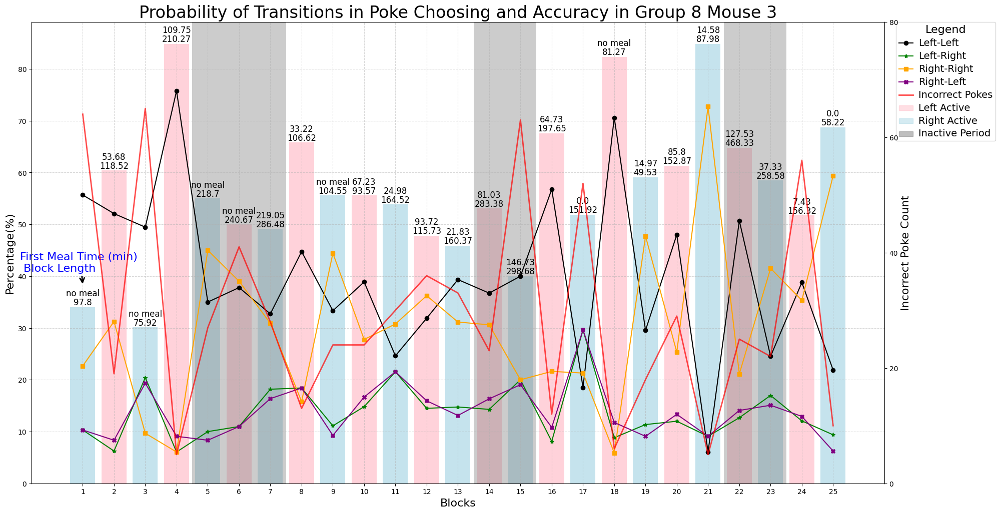

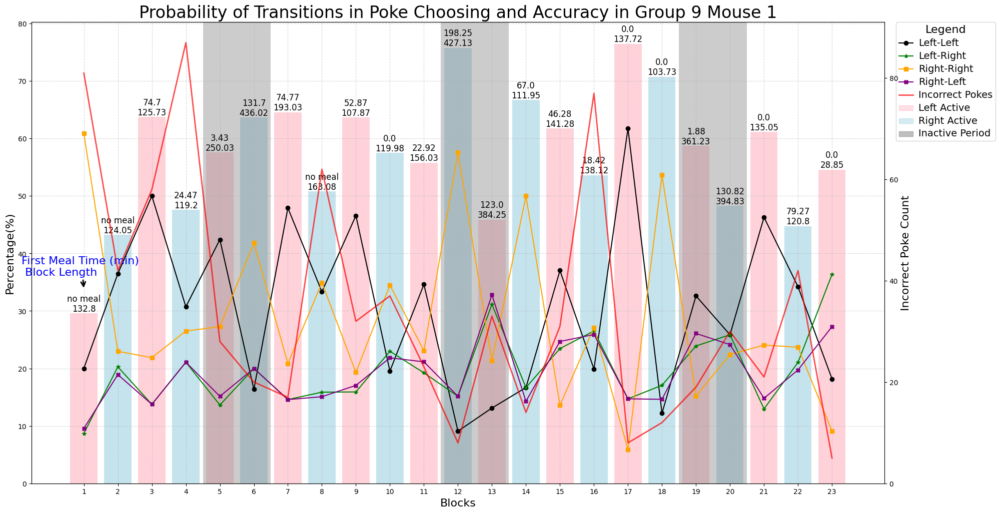

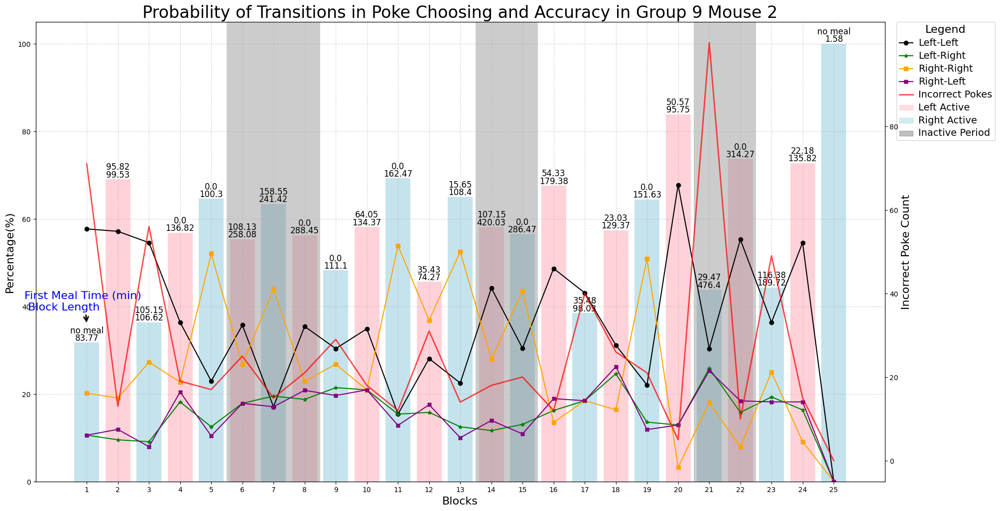

In [30]:
exp_block_fir_meal = []
exp_block_fir_meal_prop = []
for path in paths.contigency_flip_cask:
        data_dropped = read_csv_clean(path, remove_trivial=False, collect_time=True)
        blocks = dit.split_data_to_blocks(data_dropped)
        meal = find_meals(data_dropped, pellet_count_threshold=pellet_count_threshold, 
                             collect_quantile=collect_quantile, pellet_quantile=pellet_quantile)
        data_stats = dit.get_transition_info(blocks, meal, reverse=False)
        
        avg_ratio, avg_time = dit.first_meal_stats(data_stats, ignore_inactive=True)
        exp_block_fir_meal.append(avg_time)
        exp_block_fir_meal_prop.append(avg_ratio)
        dit.graph_tranition_stats(data_stats, blocks, path)

In [31]:
ctrl_block_fir_meal, exp_block_fir_meal

([32.68, 141.79500000000002, 52.42, 101.22, 68.2, 34.21],
 [17.78,
  52.19,
  36.93,
  25.52,
  27.17,
  52.825,
  52.6,
  54.73,
  39.93,
  29.15,
  26.35,
  81.03,
  35.375,
  35.43])

In [32]:
invs.perform_T_test(ctrl_block_fir_meal, exp_block_fir_meal, test_side='less')

P Value is  0.013369870375629403
Experiment group is significantly less than control group


Control Size: 6
CASK Size: 14
Control Average: 71.75416666666666
CASK Average: 40.50071428571429
Control Standard Deviation: 42.65384090755095
CASK Standard Deviation: 16.62370536973572


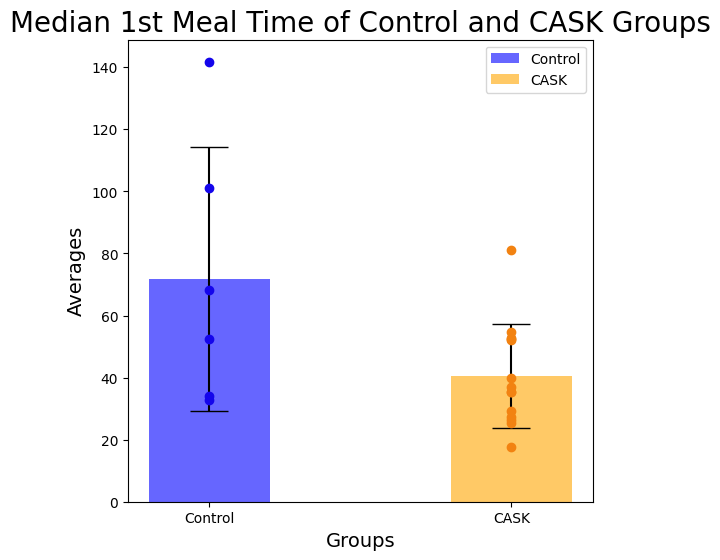

In [33]:
graph_group_stats(ctrl_block_fir_meal, exp_block_fir_meal, stats_name='Median 1st Meal Time', exp_name='CASK')

In [34]:
invs.perform_T_test(ctrl_block_fir_meal_prop, exp_block_fir_meal_prop, test_side='less')

P Value is  0.04542999076220981
Experiment group is significantly less than control group


Control Size: 6
CASK Size: 14
Control Average: 0.5065883578499271
CASK Average: 0.36583406320479084
Control Standard Deviation: 0.26799032412832724
CASK Standard Deviation: 0.0920501059188369


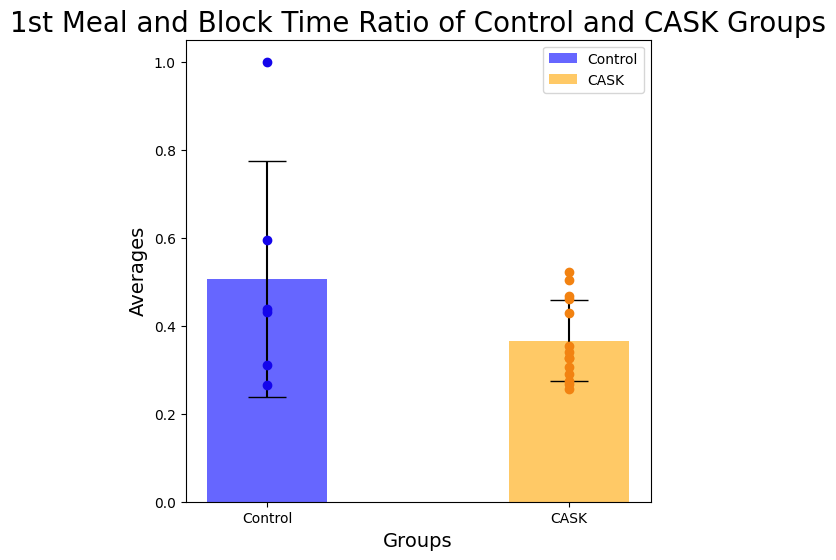

In [35]:
graph_group_stats(ctrl_block_fir_meal_prop, exp_block_fir_meal_prop, stats_name='1st Meal and Block Time Ratio', exp_name='CASK')

* In flipping poke case, we find that there is left or right stage (mice display a tendency to stick to one direction)
* there is only one stage at a time, and transition can take some times (1-2 stage to move to another)
* Generally, the accuracy is improved (>50~60% at the end and higher than the beginning)